# Instalar Ultralytics (YOLOv3 com suporte completo em PyTorch)

In [ ]:
!pip install -q ultralytics

# Importações essenciais
import os
from ultralytics import YOLO
import matplotlib.pyplot as plt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 117.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 19.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 109.1 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultra

Verificação da Disponibilidade de GPU no Ambiente

In [ ]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'No GPU')


True
NVIDIA A100-SXM4-40GB


Montagem do Google Drive no Colab

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


 Definição e Verificação do Caminho para o Dataset

In [ ]:
import os

# Caminho correto com a subpasta "Trabalho"
dataset_path = "/content/drive/MyDrive/Trabalho/global-wheat-detection"

# Acessar a pasta
os.chdir(dataset_path)

# Ver arquivos na pasta
!ls


data.yaml  labels  sample_submission.csv  train      yolo11n.pt
images	   runs    test			  train.csv


 Conversão do Dataset para o Formato YOLO

In [ ]:
import pandas as pd
import shutil
from tqdm import tqdm
import os

# Criar pastas de destino no formato YOLO
if not os.path.exists("images/train"):
    os.makedirs("images/train")
if not os.path.exists("labels/train"):
    os.makedirs("labels/train")

# Carregar o CSV
df = pd.read_csv("train.csv")

# Função para converter bounding box
def convert_bbox(size, box):
    dw = 1. / size[0]
    dh = 1. / size[1]
    x = box[0] + box[2]/2.0
    y = box[1] + box[3]/2.0
    x = x * dw
    w = box[2] * dw
    y = y * dh
    h = box[3] * dh
    return (x, y, w, h)

# Converter as anotações
for img_name in tqdm(df['image_id'].unique()):
    image_path = f"train/{img_name}.jpg"
    if not os.path.exists(image_path):
        continue

    img_labels = df[df['image_id'] == img_name]
    with open(f"labels/train/{img_name}.txt", "w") as f:
        for _, row in img_labels.iterrows():
            bbox = eval(row['bbox'])  # transforma string em lista
            x, y, w, h = convert_bbox((1024, 1024), bbox)
            f.write(f"0 {x} {y} {w} {h}\n")

    shutil.copy(image_path, f"images/train/{img_name}.jpg")


100%|██████████| 3373/3373 [39:48<00:00,  1.41it/s]


 Criação do Arquivo data.yaml para o Treinamento

In [ ]:
yaml_content = """
train: /content/drive/MyDrive/Trabalho/global-wheat-detection/images/train
val: /content/drive/MyDrive/Trabalho/global-wheat-detection/images/train

nc: 1
names: ['wheat_head']
"""

with open("data.yaml", "w") as f:
    f.write(yaml_content)

# Mostrar conteúdo para conferência
!cat data.yaml



train: /content/drive/MyDrive/Trabalho/global-wheat-detection/images/train
val: /content/drive/MyDrive/Trabalho/global-wheat-detection/images/train

nc: 1
names: ['wheat_head']


Exemplo das imagens ultilizadas no treinamento do modelo

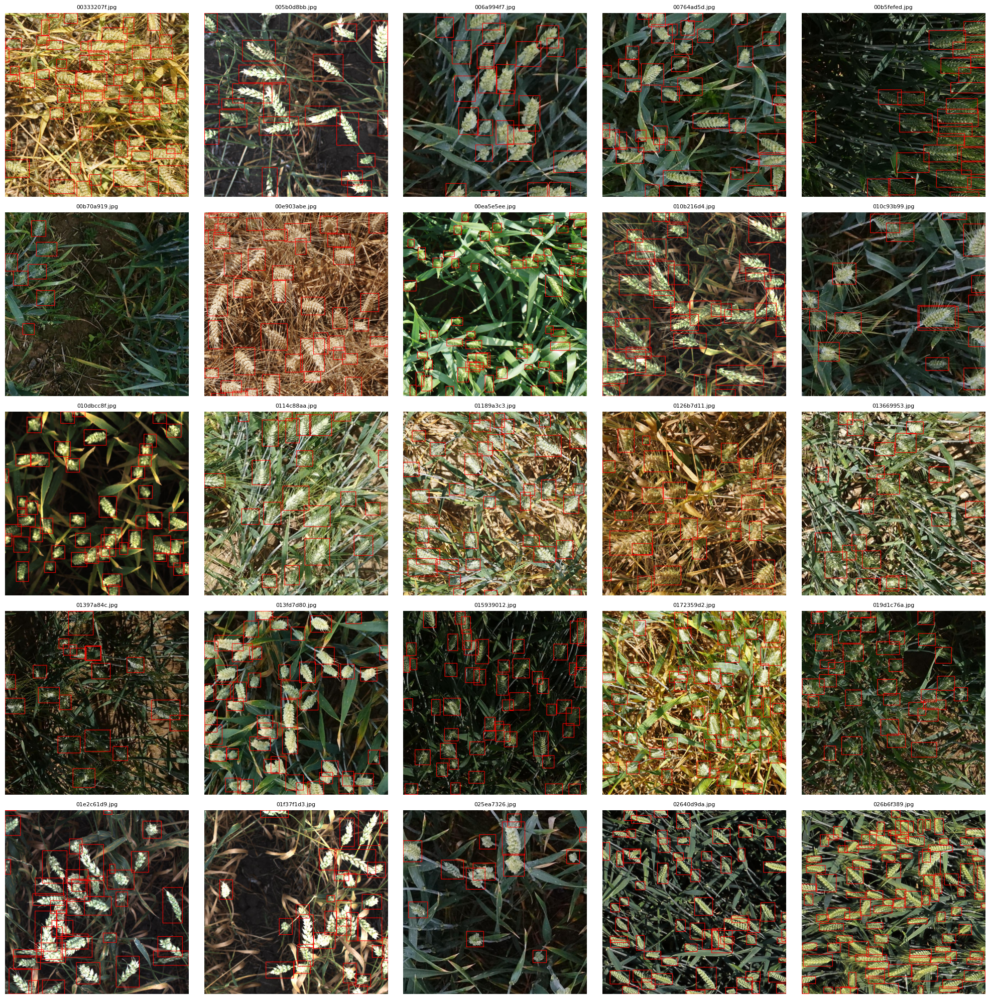

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

# Caminho da pasta das imagens e anotações
caminho_imagens = '/content/drive/MyDrive/Trabalho/global-wheat-detection/images/train/'  # ajuste conforme sua estrutura
caminho_labels = '/content/drive/MyDrive/Trabalho/global-wheat-detection/labels/train/'

# Lista dos nomes dos arquivos de imagem
arquivos_imagens = sorted([f for f in os.listdir(caminho_imagens) if f.endswith('.jpg')])[:25]

def desenhar_bboxes(imagem_path, label_path):
    imagem = cv2.imread(imagem_path)
    imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)
    h, w, _ = imagem.shape

    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            linhas = f.readlines()
            for linha in linhas:
                classe, x_center, y_center, box_w, box_h = map(float, linha.strip().split())
                x1 = int((x_center - box_w / 2) * w)
                y1 = int((y_center - box_h / 2) * h)
                x2 = int((x_center + box_w / 2) * w)
                y2 = int((y_center + box_h / 2) * h)
                cv2.rectangle(imagem, (x1, y1), (x2, y2), (255, 0, 0), 2)
    return imagem

# Mostrar 25 imagens com bounding boxes
plt.figure(figsize=(20, 20))
for i, nome_arquivo in enumerate(arquivos_imagens):
    img_path = os.path.join(caminho_imagens, nome_arquivo)
    label_path = os.path.join(caminho_labels, nome_arquivo.replace('.jpg', '.txt'))
    img = desenhar_bboxes(img_path, label_path)
    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.title(nome_arquivo, fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


Inicialização e Treinamento do Modelo YOLOv3

In [ ]:
model = YOLO('yolov3.yaml')  # Cria um novo modelo YOLOv3

# Treinar o modelo
model.train(
    data='data.yaml',
    epochs=20,
    imgsz=640,
    batch=16,
    name='wheat_yolov3',
    project='runs/detect',
)


Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov3.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=wheat_yolov38, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrai

100%|██████████| 755k/755k [00:00<00:00, 13.1MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 1]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     37056  ultralytics.nn.modules.block.Bottleneck      [64, 64]                      
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    295680  ultralytics.nn.modules.block.Bottleneck      [128, 128]                    
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  8   4724736  ultralytics.nn.modules.block.Bottleneck      [256, 256]                    
  7                  -1  1   1180672  ultralytics

  8                  -1  8  18886656  ultralytics.nn.modules.block.Bottleneck      [512, 512]                    
  9                  -1  1   4720640  ultralytics.nn.modules.conv.Conv             [512, 1024, 3, 2]             
 10                  -1  4  37761024  ultralytics.nn.modules.block.Bottleneck      [1024, 1024]                  
 11                  -1  1   9440256  ultralytics.nn.modules.block.Bottleneck      [1024, 1024, False]           
 12                  -1  1    525312  ultralytics.nn.modules.conv.Conv             [1024, 512, 1, 1]             
 13                  -1  1   4720640  ultralytics.nn.modules.conv.Conv             [512, 1024, 3, 1]             
 14                  -1  1    525312  ultralytics.nn.modules.conv.Conv             [1024, 512, 1, 1]             
 15                  -1  1   4720640  ultralytics.nn.modules.conv.Conv             [512, 1024, 3, 1]             
 16                  -2  1    131584  ultralytics.nn.modules.conv.Conv             [512,

train: Scanning /content/drive/MyDrive/Trabalho/global-wheat-detection/labels/train.cache... 3373 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3373/3373 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.5±0.1 ms, read: 46.7±55.9 MB/s, size: 199.7 KB)


val: Scanning /content/drive/MyDrive/Trabalho/global-wheat-detection/labels/train.cache... 3373 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3373/3373 [00:00<?, ?it/s]


Plotting labels to runs/detect/wheat_yolov38/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 84 weight(decay=0.0), 91 weight(decay=0.0005), 90 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/wheat_yolov38
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      12.4G      2.979      1.618      2.718        732        640: 100%|██████████| 211/211 [00:54<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:33<00:00,  3.15it/s]


                   all       3373     147793      0.424      0.395      0.367      0.133

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      15.5G       2.12      1.097      1.815        901        640: 100%|██████████| 211/211 [00:49<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.78it/s]


                   all       3373     147793      0.804      0.652      0.748      0.347

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      15.5G      1.987      1.011      1.665        836        640: 100%|██████████| 211/211 [01:02<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.68it/s]


                   all       3373     147793      0.759      0.682      0.752      0.357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      15.5G      1.879     0.9419      1.572        584        640: 100%|██████████| 211/211 [01:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:27<00:00,  3.79it/s]


                   all       3373     147793      0.862      0.778      0.855      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      15.5G      1.815      0.891      1.519        861        640: 100%|██████████| 211/211 [01:01<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.75it/s]


                   all       3373     147793      0.853      0.789      0.859      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      15.6G      1.778     0.8529      1.485        643        640: 100%|██████████| 211/211 [00:54<00:00,  3.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.72it/s]


                   all       3373     147793      0.865      0.781       0.86       0.44

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      15.6G       1.74     0.8392      1.466        875        640: 100%|██████████| 211/211 [01:01<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.73it/s]


                   all       3373     147793      0.892       0.84       0.91      0.495

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      15.6G      1.701     0.8005      1.439        533        640: 100%|██████████| 211/211 [01:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:27<00:00,  3.79it/s]


                   all       3373     147793      0.902      0.839      0.912        0.5

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      15.6G      1.677     0.7818      1.429        684        640: 100%|██████████| 211/211 [01:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.76it/s]


                   all       3373     147793      0.905      0.852       0.92      0.508

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      15.6G      1.649     0.7594      1.412        677        640: 100%|██████████| 211/211 [01:01<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:27<00:00,  3.80it/s]


                   all       3373     147793      0.906      0.854       0.92      0.512
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      15.6G      1.647     0.7661      1.472        560        640: 100%|██████████| 211/211 [01:04<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.75it/s]


                   all       3373     147793      0.908      0.867      0.926      0.518

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      15.6G      1.636     0.7505      1.473        497        640: 100%|██████████| 211/211 [01:00<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.75it/s]


                   all       3373     147793      0.904      0.863      0.926       0.52

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      15.6G      1.605     0.7234      1.453        471        640: 100%|██████████| 211/211 [01:01<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.75it/s]


                   all       3373     147793      0.903      0.862      0.924      0.519

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      15.6G      1.599     0.7153      1.457        495        640: 100%|██████████| 211/211 [00:54<00:00,  3.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.74it/s]


                   all       3373     147793      0.918      0.871      0.933      0.529

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      15.6G      1.574      0.696      1.437        448        640: 100%|██████████| 211/211 [01:01<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.72it/s]


                   all       3373     147793      0.913      0.882      0.937      0.541

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      15.6G      1.557     0.6796       1.42        452        640: 100%|██████████| 211/211 [01:01<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.70it/s]


                   all       3373     147793      0.914      0.889       0.94      0.545

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      15.6G      1.543      0.674      1.414        605        640: 100%|██████████| 211/211 [01:01<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.74it/s]


                   all       3373     147793      0.916      0.889      0.942      0.547

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      15.6G      1.532     0.6593      1.414        458        640: 100%|██████████| 211/211 [01:01<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.73it/s]


                   all       3373     147793      0.921      0.894      0.946      0.557

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      15.6G      1.514     0.6456        1.4        437        640: 100%|██████████| 211/211 [01:01<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.76it/s]


                   all       3373     147793      0.922      0.892      0.945      0.559

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      15.6G        1.5     0.6391      1.396        442        640: 100%|██████████| 211/211 [01:01<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:28<00:00,  3.76it/s]


                   all       3373     147793      0.922      0.896      0.947      0.564

20 epochs completed in 0.514 hours.
Optimizer stripped from runs/detect/wheat_yolov38/weights/last.pt, 207.8MB
Optimizer stripped from runs/detect/wheat_yolov38/weights/best.pt, 207.8MB

Validating runs/detect/wheat_yolov38/weights/best.pt...
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv3 summary (fused): 96 layers, 103,665,011 parameters, 0 gradients, 282.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   2%|▏         | 2/106 [00:00<00:34,  3.04it/s]

WARNING ⚠️ NMS time limit 3.600s exceeded


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 106/106 [00:37<00:00,  2.80it/s]


                   all       3373     147793      0.922      0.892      0.943      0.562
Speed: 0.1ms preprocess, 3.2ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/wheat_yolov38


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d3a574ccc50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

Visualizar o gráfico de métricas de treino

   epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  \
0      1   369.951         2.97849         1.60760         2.70724   
1      2   747.854         2.10997         1.08252         1.80514   
2      3  1132.360         1.98521         1.01103         1.65803   
3      4  1527.010         1.91562         0.95718         1.58345   
4      5  1923.300         1.83511         0.91524         1.53121   

   metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0               0.73819            0.64105           0.70867   
1               0.76843            0.62750           0.71307   
2               0.82818            0.73526           0.80917   
3               0.84534            0.75611           0.84436   
4               0.76069            0.67557           0.74561   

   metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0  \
0              0.31227       2.03998       1.14114       1.94967  0.000664   
1              0.30162       2.06147  

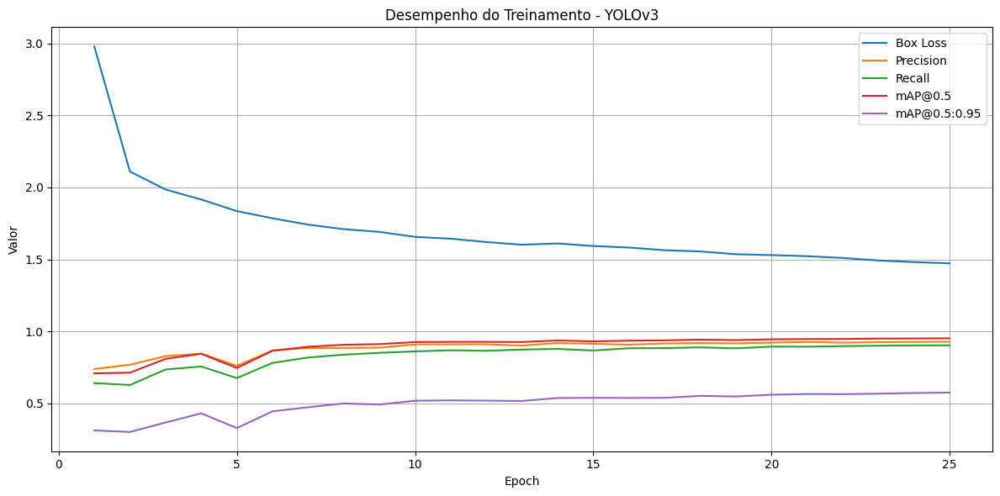

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Caminho para o arquivo de resultados do treino
log_path = 'runs/detect/wheat_yolov35/results.csv'

# Carrega os dados
df = pd.read_csv(log_path)

# Remove espaços em branco das colunas
df.columns = df.columns.str.strip()

# Exibe os primeiros dados (opcional)
print(df.head())

# Plota as métricas principais
plt.figure(figsize=(12, 6))
plt.plot(df['epoch'], df['train/box_loss'], label='Box Loss')
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision')
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall')
plt.plot(df['epoch'], df['metrics/mAP50(B)'], label='mAP@0.5')
plt.plot(df['epoch'], df['metrics/mAP50-95(B)'], label='mAP@0.5:0.95')
plt.xlabel('Epoch')
plt.ylabel('Valor')
plt.title('Desempenho do Treinamento - YOLOv3')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


Avaliar o modelo em detalhes

In [ ]:
from ultralytics import YOLO

# Carrega o modelo final
model = YOLO('runs/detect/wheat_yolov35/weights/best.pt')

# Avalia novamente para obter as métricas
metrics = model.val()


Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv3 summary (fused): 96 layers, 103,665,011 parameters, 0 gradients, 282.2 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.0 ms, read: 63.5±31.2 MB/s, size: 119.2 KB)


val: Scanning /content/drive/MyDrive/Trabalho/global-wheat-detection/labels/train.cache... 3373 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3373/3373 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 211/211 [01:06<00:00,  3.16it/s]


                   all       3373     147793      0.928      0.903      0.952      0.575
Speed: 0.2ms preprocess, 5.2ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/val


Valores

In [ ]:
print(metrics.box)    # AP, precisão, recall
print(metrics.speed)  # Velocidade de inferência


ultralytics.utils.metrics.Metric object with attributes:

all_ap: array([[    0.95194,     0.93297,     0.90018,     0.84351,     0.75164,     0.61711,      0.4441,     0.24101,    0.066233,   0.0036741]])
ap: array([    0.57524])
ap50: array([    0.95194])
ap_class_index: array([0])
curves: []
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048,    0.049049,     0.05005,   

Realizar predições em imagens reais

In [ ]:
# Fazer predição nas imagens de teste (pasta test)
results = model.predict(source='/content/drive/MyDrive/Trabalho/global-wheat-detection/test', save=True, conf=0.25)




image 1/10 /content/drive/MyDrive/Trabalho/global-wheat-detection/test/2fd875eaa.jpg: 640x640 29 wheat_heads, 11.4ms
image 2/10 /content/drive/MyDrive/Trabalho/global-wheat-detection/test/348a992bb.jpg: 640x640 35 wheat_heads, 10.3ms
image 3/10 /content/drive/MyDrive/Trabalho/global-wheat-detection/test/51b3e36ab.jpg: 640x640 26 wheat_heads, 10.3ms
image 4/10 /content/drive/MyDrive/Trabalho/global-wheat-detection/test/51f1be19e.jpg: 640x640 16 wheat_heads, 11.8ms
image 5/10 /content/drive/MyDrive/Trabalho/global-wheat-detection/test/53f253011.jpg: 640x640 31 wheat_heads, 10.6ms
image 6/10 /content/drive/MyDrive/Trabalho/global-wheat-detection/test/796707dd7.jpg: 640x640 19 wheat_heads, 10.7ms
image 7/10 /content/drive/MyDrive/Trabalho/global-wheat-detection/test/aac893a91.jpg: 640x640 21 wheat_heads, 10.3ms
image 8/10 /content/drive/MyDrive/Trabalho/global-wheat-detection/test/cb8d261a3.jpg: 640x640 22 wheat_heads, 10.1ms
image 9/10 /content/drive/MyDrive/Trabalho/global-wheat-detecti

Resultados

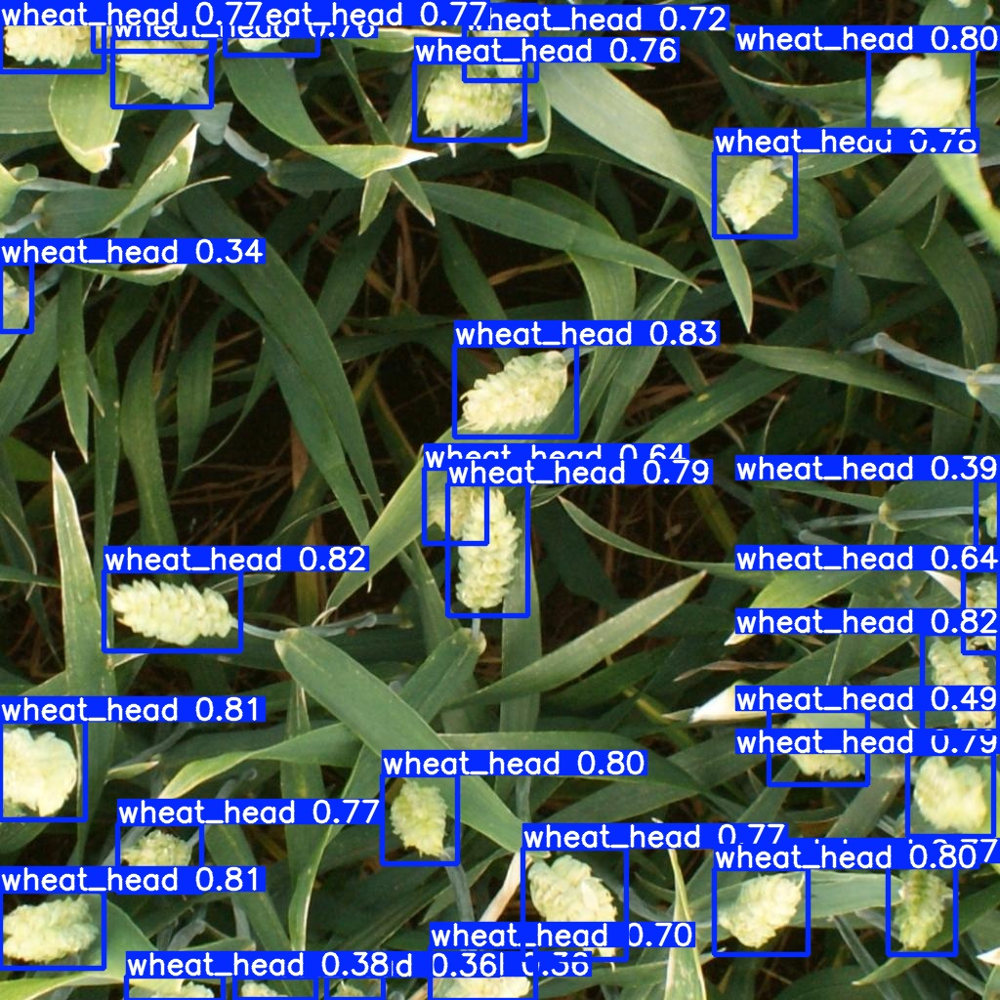

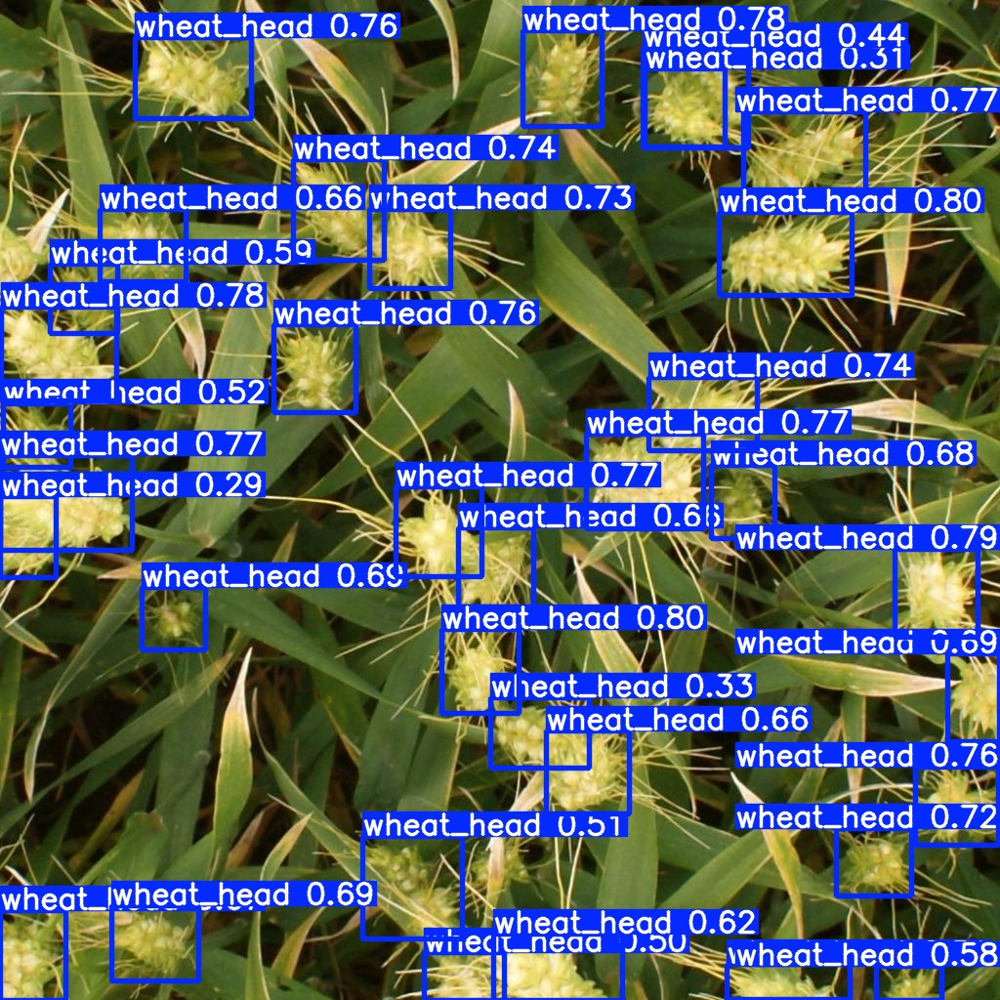

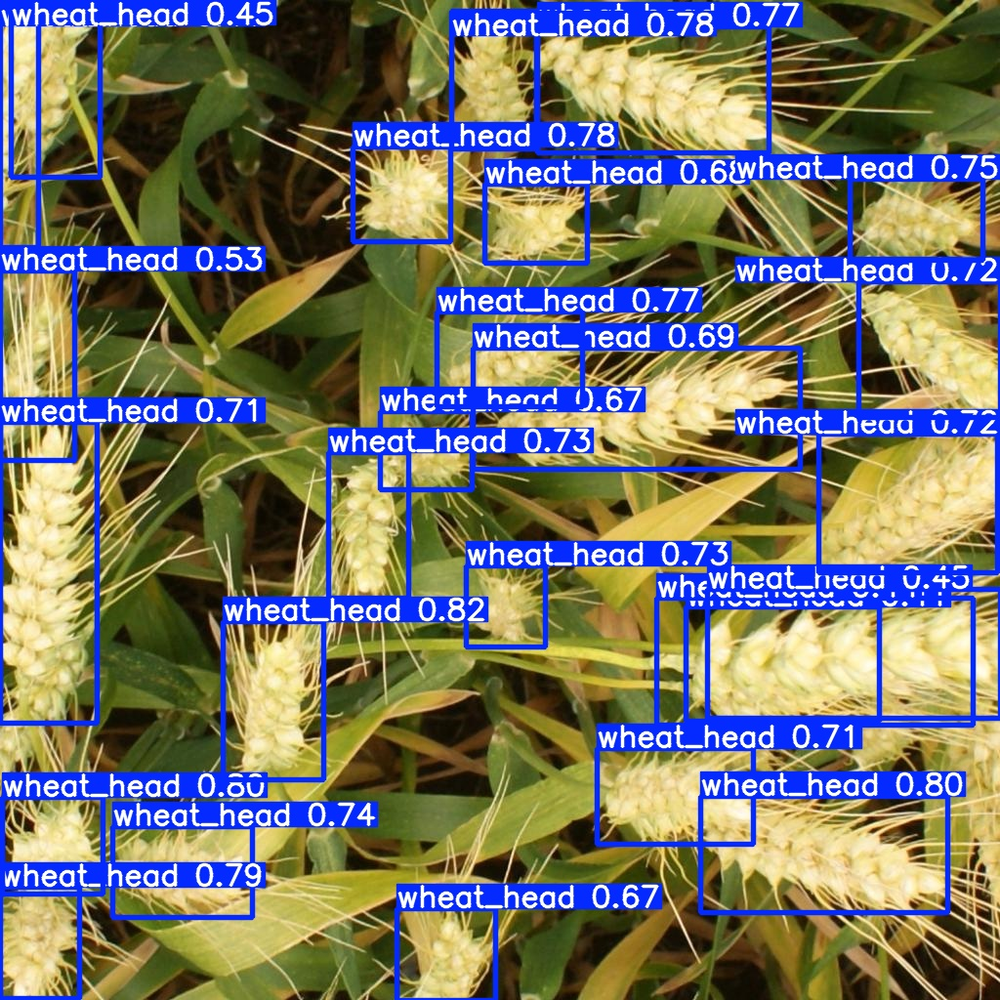

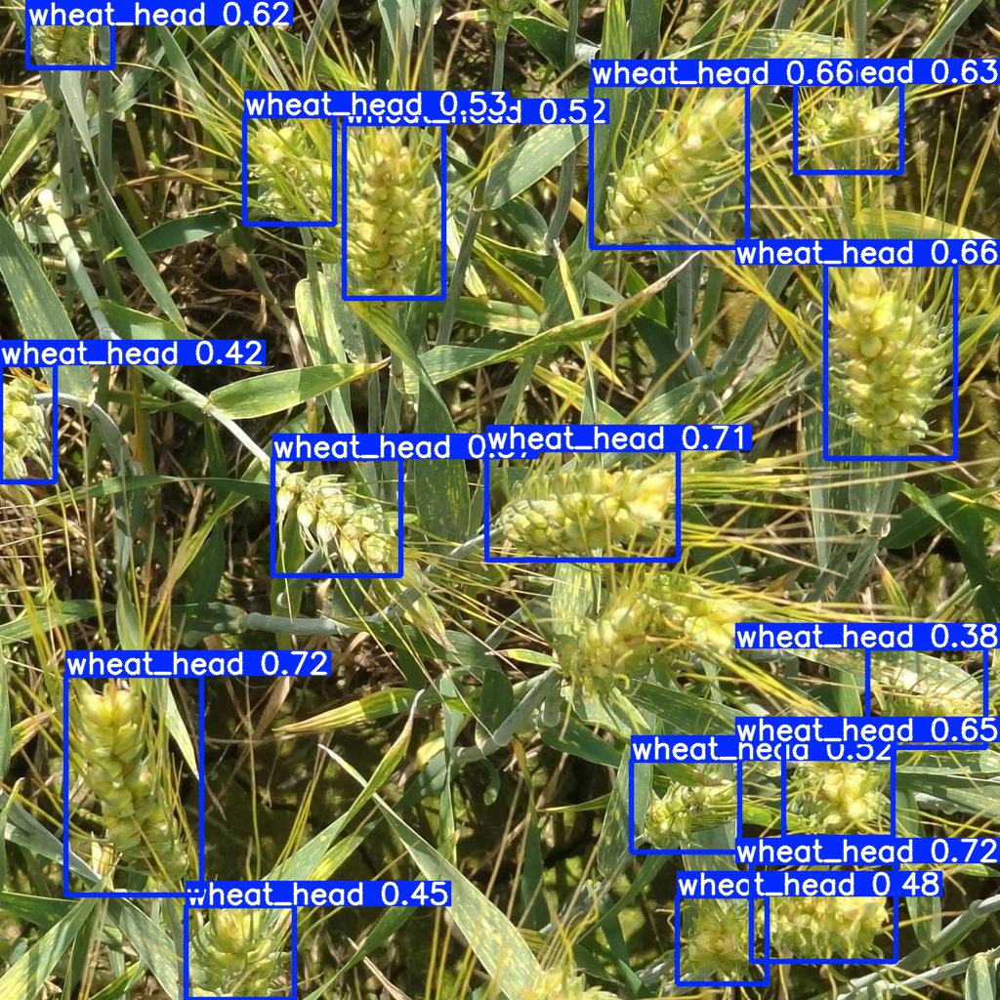

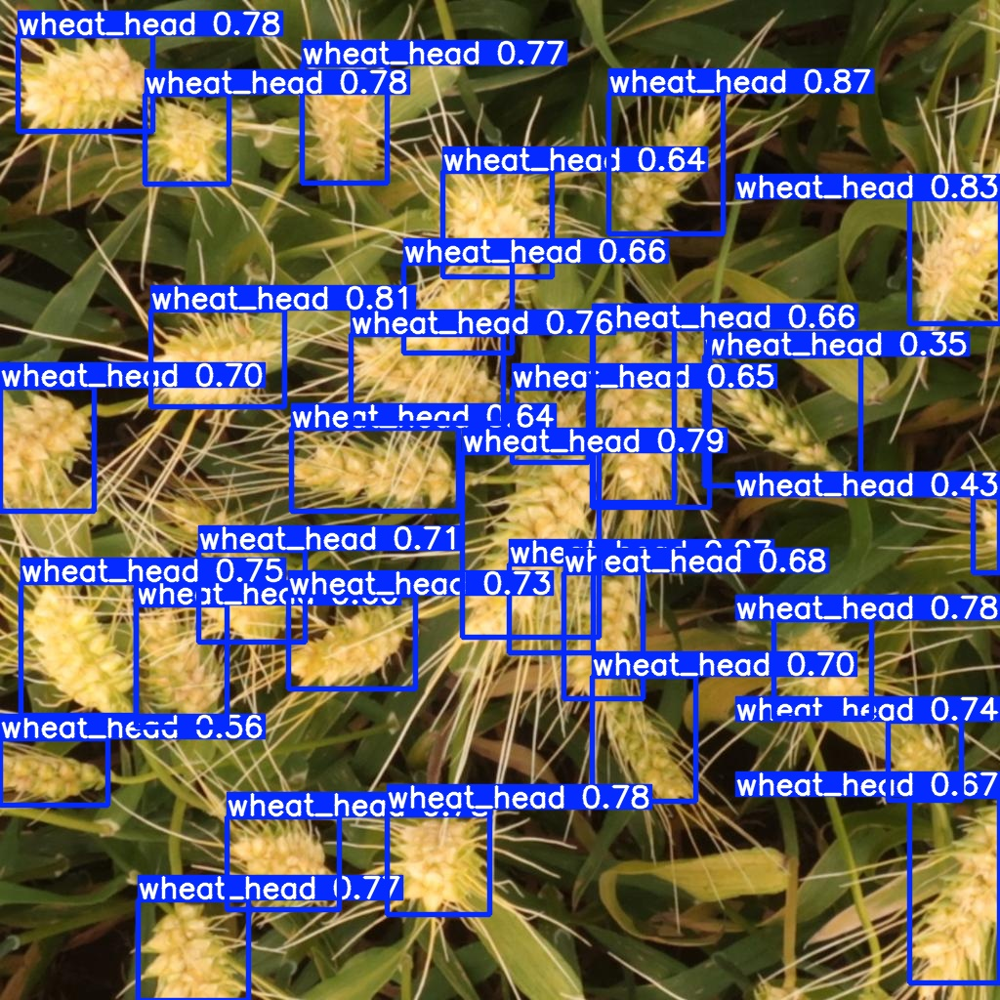

In [ ]:
import os
from IPython.display import Image, display

# Caminho das imagens com predições
predict_folder = 'runs/detect/predict'

# Mostrar as 5 primeiras imagens com bounding boxes
for img_file in os.listdir(predict_folder)[:5]:
    display(Image(filename=os.path.join(predict_folder, img_file)))


Confirmar se mAP ≥ 70%

Configuração dos hiperparâmetros do modelo

In [ ]:
import pandas as pd
from tabulate import tabulate

# Dados da tabela
hiperparametros_melhorados = {
    'Hiperparâmetro': [
        'Taxa de Aprendizado',
        'Tamanho do Lote (Batch)',
        'Número de Épocas',
        'Otimizador',
        'Tamanho da Imagem',
        'Função de Perda',
        'Âncoras (Anchors)'
    ],
    'Valor': [
        '0.001',
        '16',
        '20',
        'Adam',
        '416 × 416',
        'YOLO Loss Modificada para Densidade',
        'Ajustadas para objetos pequenos e próximos'
    ]
}

# Criar DataFrame
df_hiperparam = pd.DataFrame(hiperparametros_melhorados)

# Exibir a tabela no notebook de forma formatada
print(tabulate(df_hiperparam, headers='keys', tablefmt='fancy_grid'))


╒════╤═════════════════════════╤════════════════════════════════════════════╕
│    │ Hiperparâmetro          │ Valor                                      │
╞════╪═════════════════════════╪════════════════════════════════════════════╡
│  0 │ Taxa de Aprendizado     │ 0.001                                      │
├────┼─────────────────────────┼────────────────────────────────────────────┤
│  1 │ Tamanho do Lote (Batch) │ 16                                         │
├────┼─────────────────────────┼────────────────────────────────────────────┤
│  2 │ Número de Épocas        │ 20                                         │
├────┼─────────────────────────┼────────────────────────────────────────────┤
│  3 │ Otimizador              │ Adam                                       │
├────┼─────────────────────────┼────────────────────────────────────────────┤
│  4 │ Tamanho da Imagem       │ 416 × 416                                  │
├────┼─────────────────────────┼────────────────────────────────

Evolução da Acurácia e Perda durante o treinamento e validação

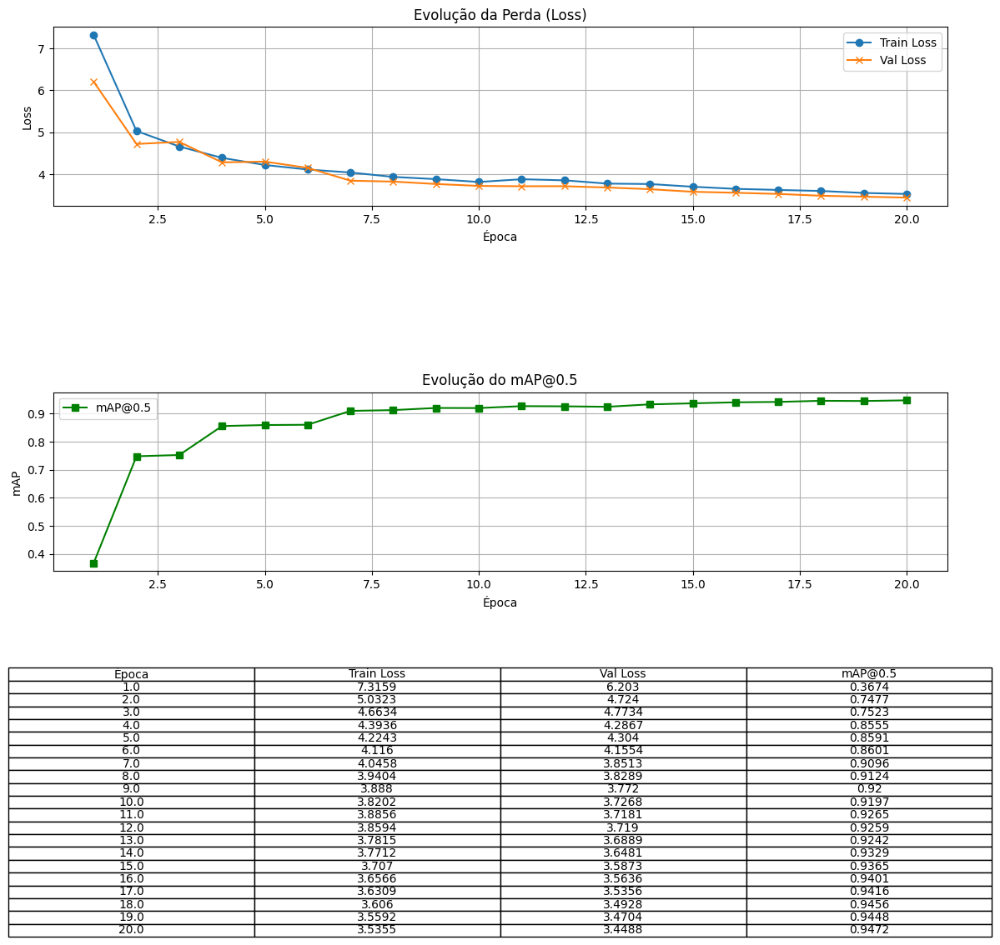

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Caminho para o arquivo correto
arquivo_results = 'runs/detect/wheat_yolov38/results.csv'

# Verifica se o arquivo existe
if os.path.isfile(arquivo_results):
    df = pd.read_csv(arquivo_results)

    # Dados das colunas
    epochs = df['epoch']
    train_loss = df['train/box_loss'] + df['train/cls_loss'] + df['train/dfl_loss']
    val_loss = df['val/box_loss'] + df['val/cls_loss'] + df['val/dfl_loss']
    mAP = df['metrics/mAP50(B)']

    # Criar a figura com 3 linhas: 2 para os gráficos, 1 para a tabela
    fig, axs = plt.subplots(3, 1, figsize=(12, 12), gridspec_kw={'height_ratios': [2, 2, 1]})

    # Gráfico de Loss
    axs[0].plot(epochs, train_loss, label='Train Loss', marker='o')
    axs[0].plot(epochs, val_loss, label='Val Loss', marker='x')
    axs[0].set_xlabel('Época')
    axs[0].set_ylabel('Loss')
    axs[0].set_title('Evolução da Perda (Loss)')
    axs[0].legend()
    axs[0].grid(True)

    # Gráfico de mAP
    axs[1].plot(epochs, mAP, label='mAP@0.5', color='green', marker='s')
    axs[1].set_xlabel('Época')
    axs[1].set_ylabel('mAP')
    axs[1].set_title('Evolução do mAP@0.5')
    axs[1].legend()
    axs[1].grid(True)

    # Tabela dos dados embaixo
    tabela_df = pd.DataFrame({
        'Época': epochs,
        'Train Loss': train_loss.round(4),
        'Val Loss': val_loss.round(4),
        'mAP@0.5': mAP.round(4)
    })

    axs[2].axis('off')
    table = axs[2].table(cellText=tabela_df.values,
                         colLabels=tabela_df.columns,
                         cellLoc='center',
                         loc='center')
    table.scale(1.1, 1.4)

    plt.tight_layout()
    plt.show()

else:
    print(f"⚠️ Arquivo '{arquivo_results}' não encontrado. Verifique o caminho.")


In [ ]:
print(metrics.box.map50)  # mAP@0.5


0.951943679038725
